# Sistema di Face Detection per una fotocamera digitale <br> Master in Data Science - Profession AI <br> Virginio Cocciaglia

## Contesto del progetto e sfida

La **ProCam S.p.A.** è pronta a lanciare una nuova fotocamera digitale compatta, accessibile e pensata per i giovani appassionati di fotografia. L'obiettivo principale del prodotto è facilitare l'esperienza di scatto, in particolare per i selfie con una o più persone.

Sei stato assunto come **Data Scientist** per sviluppare un **sistema di rilevamento volti** nelle immagini, che aiuterà i tecnici a ottimizzare automaticamente le impostazioni della fotocamera durante i selfie. Il tuo compito è realizzare una pipeline che identifichi i volti presenti nelle immagini e restituisca le coordinate dei **bounding box** dove i volti sono individuati. Se non ci sono volti, la pipeline restituirà una lista vuota.

Si tratta di un problema di **Computer Vision**, più precisamente di **Face Detection**.

## Requisiti del progetto

1. **Obiettivo**: Costruire un sistema di rilevamento dei volti utilizzando Scikit-learn. La pipeline deve essere in grado di:
    - Prendere un’immagine in ingresso.
    - Restituire una lista di coordinate dei bounding box dove sono presenti volti.
    - Restituire una lista vuota se nell’immagine non ci sono volti.

2. **Limitazioni**:

    - **Dataset**: Non ti viene fornito un dataset. Devi cercare un dataset adatto in rete o, in mancanza di alternative, costruirlo tu stesso.
    - **Modelli pre-addestrati**: Non è consentito utilizzare modelli pre-addestrati. Il modello di Face Detection dovrà essere addestrato da zero con Scikit-learn.
    - **Risorse di calcolo**: Lavorerai su un sistema con capacità di calcolo limitate. Il modello dovrà essere ottimizzato per utilizzare poche risorse.

3. **Documentazione**: La soluzione deve essere ben documentata. Ogni decisione adottata (scelta degli algoritmi, preprocessamento, tecniche di ottimizzazione) dovrà essere spiegata. Inoltre, ogni risorsa esterna utilizzata (paper accademici, articoli di blog, codice GitHub) dovrà essere citata.

4. **Ricerca bibliografica**: Poiché non ti vengono fornite indicazioni dettagliate sull'implementazione, è essenziale condurre un'approfondita ricerca bibliografica per identificare le soluzioni migliori. Dovrai analizzare approcci già esistenti e adattarli alle limitazioni del progetto.

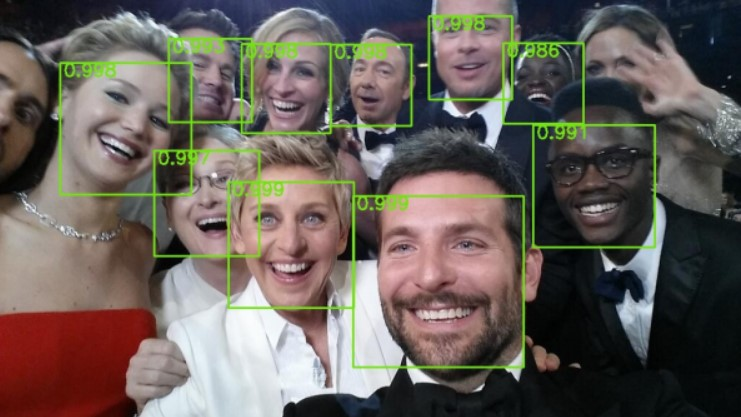

## Scelta del modello e delle tecniche da utilizzare

Prendendo in considerazione le richieste di base, ossia addestrare un modello che richiede poche risorse di calcolo, effettuate le necessarie ricerche, si è giunti alla conclusione che il miglior modo per realizzare il sistema di identificazione dei volti nelle immagini è seguire i seguenti passi:
1. Costruire un dataset contenente immagini con soli volti e con non volti, rendendolo bilanciato.
2. Estrarre dalle immagini le **HOG Features**.
3. Addestrare una **Support Vector Machine** dando in input le hog features in modo da stabilire se nell'immagine è presente un volto oppure no: **Face Classification**.
4. Utilizzare in combinazione le due tecniche **Image Pyramids** e **Sliding Windows** per individuare i riquadri attorno ai volti nelle immagini (nel caso siano presenti): **Face Detection**.

Tale prototipo per l'identificazione di volti verrà realizzato utilizzando *scikit-learn* e le sue librerie.


## Importazione delle librerie

Vengono innanzitutto importate tutte le librerie necessarie allo sviluppo del prototipo.

In [ ]:
import numpy as np
import os
import zipfile
import shutil
import cv2
import matplotlib.pyplot as plt
import random
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
import joblib
import imutils
from google.colab.patches import cv2_imshow

## Costruzione del dataset

Per la costruzione del dataset su cui lavorare si sceglie di prendere in considerazione due differenti dataset, disponibili online su Kaggle, uno per le immagini contenenti solo volti ed uno per le immagini contenenti "non volti" che sono rispettivamente:
* FaceScrub
* Self-Taught Learning 10 (STL-10)


### FaceScrub Dataset

**FaceScrub** è un dataset costituito da un totale di 106863 immagini di volti di 530 celebrità maschili e femminili, con circa 200 immagini per persona. Si tratta quindi di uno dei più grandi database pubblici di volti. In questo caso però viene presa in esame una versione ridotta di questo dataset costituita da **43100 immagini** di volti provenienti sempre dalle 530 celebrità maschili e femminili  (265 attori e 265 attrici). Le immagini in questione sono per la maggior parte **jpeg** ma sono presenti anche **png** e **bpm** ed hanno **dimensioni in pixel variabili**.

https://vintage.winklerbros.net/facescrub.html<br>
https://www.kaggle.com/datasets/rajnishe/facescrub-full/data

Il dataset, come già detto, è presente su Kaggle, si utilizza pertanto il modulo *os* di Python per impostare le variabili d'ambiente che permettono l'autenticazione con l'API di Kaggle.

In [ ]:
kaggle_creds = {'KAGGLE_USERNAME': 'your_username',
                'KAGGLE_KEY': 'your_api_key'}

os.environ['KAGGLE_USERNAME'] = kaggle_creds['KAGGLE_USERNAME']
os.environ['KAGGLE_KEY'] = kaggle_creds['KAGGLE_KEY']

Il dataset facescrub è costituito da due cartelle, una per gli attori e una per le attrici, a loro volta suddivise in delle sottocartelle per ciascuna individuo con le foto che lo ritraggono. Si procede, allora, a scaricare l'intero file zip del dataset da Kaggle e estrarre le due cartelle *actor_faces* e *actress_faces* tramite il modulo *zipfile*.

In [ ]:
!kaggle datasets download -d rajnishe/facescrub-full

DATA_FOLDER = '/content/data'
os.makedirs(DATA_FOLDER, exist_ok=True)

ZIP_FILE = '/content/facescrub-full.zip'

with zipfile.ZipFile(ZIP_FILE, 'r') as zip_ref:
    zip_ref.extractall(DATA_FOLDER)

Dataset URL: https://www.kaggle.com/datasets/rajnishe/facescrub-full
License(s): GNU Affero General Public License 3.0
100% 645M/645M [00:28<00:00, 31.7MB/s]
100% 645M/645M [00:28<00:00, 24.1MB/s]


Le cartelle *actor_faces* e *actress_faces* appena estratte, come già detto, contengono al loro interno delle ulteriori sottocartelle contenenti le foto per ciascun individuo, per questo motivo viene creata una nuova cartella *faces* in cui verranno inserite le immagini senza suddivisioni in cartelle. Tale suddivisione, infatti, non risulta utile ai fini del presente problema. Per la creazione della cartella viene definita e utilizzata la funzione *select_and_move_images* prendendo in considerazione soltanto in modo casuale la metà delle immagini a disposizione e unicamente quelle in formato jpeg. Si è deciso di selezionare casualmente il 50 % di immagini di attori e il 50 % di attrici, riducendo considerevolmente la dimensione totale del dataset di volti, poichè si ha la necessità di addestrare un modello che richiede poche risorse di calcolo. Per quanto riguarda, invece, la selezione esclusiva delle immagini jpeg, ciò non è strettamente necessario ma può essere preferibile avere un dataset omogeneo nel formato delle immagini (oltre al fatto che quasi la totalità delle immagini sono in jpeg).

In [ ]:
ACTOR_FOLDER = '/content/data/actor_faces'
ACTRESS_FOLDER = '/content/data/actress_faces'

TARGET_FOLDER = '/content/faces'
os.makedirs(TARGET_FOLDER, exist_ok=True)


def select_and_move_images(source_folder, target_folder, fraction=0.5, seed=42):

    """
    Select a fraction of JPEG images from the source folder and move them to the
    target folder.

    Parameters:
    source_folder (str): Path to the source folder containing images.
    target_folder (str): Path to the target folder where selected images will be
                         moved.
    fraction (float): Fraction of images to select and move. Default is 0.5.
    seed (int): Seed for random number generator to ensure reproducibility.
                Default is 42.
    """

    random.seed(seed)

    for root, _, files in os.walk(source_folder):
        jpeg_files = [file for file in files if file.endswith('.jpeg')]
        num_files_to_select = int(len(jpeg_files) * fraction)
        selected_files = random.sample(jpeg_files, num_files_to_select)

        for file in selected_files:
            source_file = os.path.join(root, file)
            target_file = os.path.join(target_folder, file)
            shutil.move(source_file, target_file)


select_and_move_images(ACTOR_FOLDER, TARGET_FOLDER)
select_and_move_images(ACTRESS_FOLDER, TARGET_FOLDER)

num_images_faces = len(os.listdir(TARGET_FOLDER))
print('Number of images with faces:', num_images_faces)

Number of images with faces: 20966


Si è ottenuta, dunque, la cartella *faces* costituita da **20966 immagini** di volti in formato **jpeg**.

A questo punto si procede a verificare quale sia l'immagine con le dimensioni più piccole e quella con le dimensioni più grandi (in pixel). Inoltre, si verifica anche che tutte le immagini siano a colori (3 canali).

In [ ]:
smallest_image = None
largest_image = None
smallest_dimensions = None
largest_dimensions = None
all_color_images = True

for img_name in os.listdir(TARGET_FOLDER):
    img_path = os.path.join(TARGET_FOLDER, img_name)

    img = cv2.imread(img_path)

    if img is None:
        print(f"Unable to read image {img_name}.")
        continue

    height, width, channels = img.shape

    if smallest_dimensions is None or largest_dimensions is None:
        smallest_dimensions = (height, width)
        largest_dimensions = (height, width)

    if (height * width) < (smallest_dimensions[0] * smallest_dimensions[1]):
        smallest_dimensions = (height, width)
        smallest_image = img_name

    if (height * width) > (largest_dimensions[0] * largest_dimensions[1]):
        largest_dimensions = (height, width)
        largest_image = img_name

    if channels != 3:
        all_color_images = False

if smallest_image:
    print(f'The smallest image is {smallest_image} with dimensions '+
          f'{smallest_dimensions[0]}x{smallest_dimensions[1]} pixels.')

if largest_image:
    print(f'The largest image is {largest_image} with dimensions '+
          f'{largest_dimensions[0]}x{largest_dimensions[1]} pixels.')

if all_color_images:
    print('All images are color images.')
else:
    print('Not all images are color images.')

The smallest image is Rupert_Friend_98501_50821.jpeg with dimensions 103x103 pixels.
The largest image is Rupert_Grint_99137_51157.jpeg with dimensions 2857x2857 pixels.
All images are color images.


Dunque, l'immagine più piccola ha dimensioni **103x103 pixels** mentre quella più grande ha dimensioni **2857x2857 pixels**. Inoltre, tutte le immagini hanno **3 canali** (immagini a colori RGB).

Vengono mostrate di seguito alcune immagini presenti nel dataset utilizzando *cv2* e *matplotlib*.

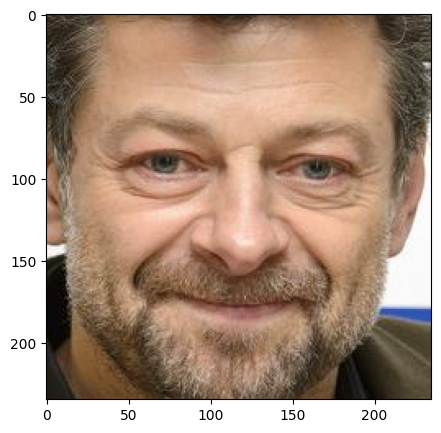

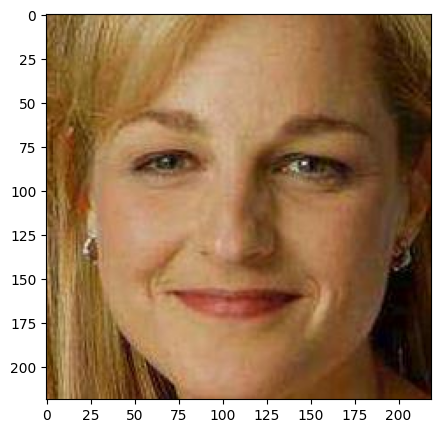

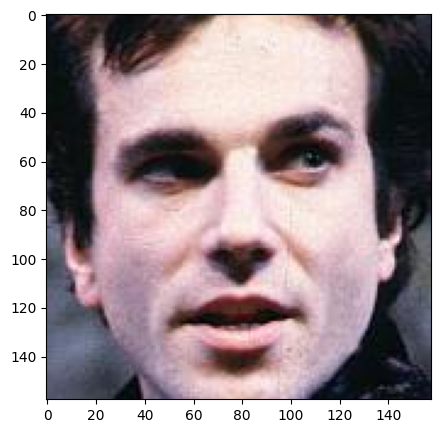

In [ ]:
image_files = os.listdir(TARGET_FOLDER)

for i in range(3):
    image_path = os.path.join(TARGET_FOLDER, image_files[i])
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(5, 5))
    plt.imshow(image_rgb)
    plt.show()

### STL-10 Dataset

Per quanto riguarda il dataset costituito da "non volti" viene utilizzato: **Self-Taught Learning 10 (STL-10)**. Si tratta di un set di dati per il riconoscimento delle immagini ispirato al CIFAR-10 con alcuni miglioramenti. È costituito da 100000 immagini non etichettate e 13000 immagini etichettate di 10 classi di oggetti (come uccelli, gatti, camion), di cui 5000 immagini sono utilizzate per l'addestramento e le restanti 8000 per il test. Tutte le immagini sono a **colori** e hanno una dimensione di **96x96 pixels** in formato **png**.

Per il presente problema vengono prese in considerazione soltanto le **100000 immagini non etichettate** che provengono dal dataset ImageNet e sono costituite da immagini appartenenti alle 10 classi delle immagini etichettate (airplane, bird, car, cat, deer, dog, horse, monkey, ship, truck) più ulteriori classi aggiuntive.

https://www.kaggle.com/datasets/jessicali9530/stl10 <br>
https://paperswithcode.com/dataset/stl-10



Si procede allora ad effettuare il download del dataset STL-10 in formato zip da Kaggle e ad estrarre soltanto la cartella *unlabeled_images*.

In [ ]:
!kaggle datasets download -d jessicali9530/stl10

ZIP_FILE = '/content/stl10.zip'

with zipfile.ZipFile(ZIP_FILE, 'r') as zip_ref:
    for member in zip_ref.namelist():
        if member.startswith('unlabeled_images/') and not member.endswith('/'):
            zip_ref.extract(member, DATA_FOLDER)

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/stl10
License(s): other
100% 1.88G/1.88G [01:12<00:00, 37.4MB/s]
100% 1.88G/1.88G [01:12<00:00, 27.8MB/s]


In questo caso le immagini sono in formato png a differenza del dataset FaceScrub in cui le immagini sono jpeg. Pertanto, anche se non strettamente necessario, per evitare eventuali problemi di compatibilità e creare un dataset omogeneo nel formato si trasformano le immagini presenti nel dataset STL-10 in jpeg e le si salvano nella cartella *not_faces*.

In [ ]:
PNG_FOLDER = '/content/data/unlabeled_images'
JPEG_FOLDER = '/content/not_faces'
os.makedirs(JPEG_FOLDER , exist_ok=True)

png_files = os.listdir(PNG_FOLDER)

for png_file in png_files:
    if png_file.endswith('.png'):
        png_path = os.path.join(PNG_FOLDER, png_file)
        img = cv2.imread(png_path)
        jpeg_path = os.path.join(JPEG_FOLDER,
                                 os.path.splitext(png_file)[0] + '.jpeg')
        cv2.imwrite(jpeg_path, img)

num_images_not_faces = len(os.listdir(JPEG_FOLDER))
print('Number of images without faces:', num_images_not_faces)

Number of images without faces: 100000


Si è ottenuta, dunque, la cartella *not_faces* costituita da **100000 immagini** di volti in formato **jpeg**.

Si verfiica allora che tutte le immagini presenti abbiano stesse dimensioni (96x96 pixels) e stessi canali (immagini RGB).

In [ ]:
first_image_info = None
same_dimensions = True
same_channels = True

for img_name in os.listdir(JPEG_FOLDER):
    img_path = os.path.join(JPEG_FOLDER, img_name)
    img = cv2.imread(img_path)

    height, width, channels = img.shape

    if first_image_info is None:
        first_image_info = (width, height, channels)
        print(f'Image: {img_name}, Dimensions: {width}x{height} pixels, '+
              f'Channels: {channels}')
    else:
        if (width, height, channels) != first_image_info:
            print(f'Image {img_name} has different dimensions or channels than'+
                  f'the first images.')
            same_dimensions = False
            same_channels = False
            break

if same_dimensions and same_channels:
    print('All images have the same size and number of channels')
else:
    print('Not all images have the same size and number of channels')

Image: unlabeled_image_png_97506.jpeg, Dimensions: 96x96 pixels, Channels: 3
All images have the same size and number of channels


Ciascuna immagine ha dimensioni **96x96 pixels** e **3 canali** (immagini a colori RGB).


Vengono, infine, mostrate alcune immagini presenti nel dataset.

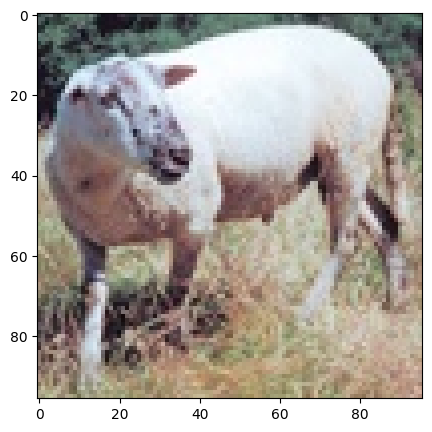

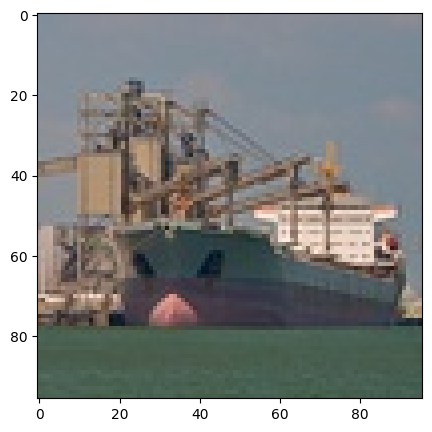

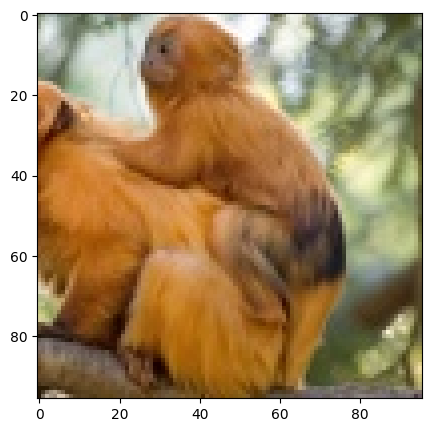

In [ ]:
image_files = os.listdir(JPEG_FOLDER)

for i in range(3):
    image_path = os.path.join(JPEG_FOLDER, image_files[i])
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(5, 5))
    plt.imshow(image_rgb)
    plt.show()

### Preprocessing dei dataset

#### Ridimensionamento e conversione in scala di grigi delle immagini dei volti

Le prime operazione di preprocessing necessarie vengono effettuate sul dataset dei volti e sono:
* **Ridimensionamento dei pixels**: tramite la funzione *resize* di *cv2* con metodo di interpolazione *INTER_AREA* la quantità di pixels delle immagini dei volti viene uniformata a 64x64. Viene scelta questa quantità di pixels perchè è quella più adatta per problemi di face detection.
* **Conversione in scala di grigi**: tramite la funzione *cvtColor* di *cv2* e specificando tra gli argomenti *cv2.COLOR_BGR2GRAY* si effettua la conversione in scala di grigi delle immagini (1 singolo canale invece di 3). In questo modo, in seguito, l'addestramento del modello sarà meno gravoso a livello computazione senza però perdere qualità nei risultati.

Importante sottilineare che per comodità le immagini trasformate verranno salvate nella lista python *faces*.

In [ ]:
FACES_FOLDER = '/content/faces'
TARGET_SIZE = (64, 64)

faces = []

for filename in os.listdir(FACES_FOLDER):
    img_path = os.path.join(FACES_FOLDER, filename)
    img = cv2.imread(img_path)

    resized_img = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)

    gray_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)

    faces.append(gray_img)

faces = np.array(faces)

print('Shape of faces array:', faces.shape)

Shape of faces array: (20966, 64, 64)


Dunque, effettuate le trasformazioni, si ottiene l'array *faces* che ha dimensioni (20966, 64, 64): 20966 immagini di volti ognuna costituita da 64x64 pixels con un singolo canale.

A titolo esemplificativo viene mandata a schermo la prima immagine dell'array.

array([[ 58,  54,  63, ...,  71,  83, 100],
       [ 50,  55,  57, ...,  71,  71,  77],
       [ 50,  44,  43, ...,  64,  65,  68],
       ...,
       [ 30,  32,  37, ...,  81,  84,  84],
       [ 28,  31,  34, ...,  77,  77,  79],
       [ 28,  30,  32, ...,  74,  77,  77]], dtype=uint8)
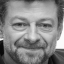

In [ ]:
faces[0]

Si ottiene l'immagine in scala di grigi con le dimensioni desiderate.

#### Riduzione del numero di immagini di non volti, ridimensionamento e conversione in scala di grigi

Per quanto riguarda il dataset dei non volti vengono effettuate le seguenti operazioni:
* **Riduzione del numero di immagini**: per bilanciare equamente i volti e i non volti questi ultimi vengono ridotti in numero scegliendo casualmente, tramite *shuffle* del modulo *random*, 20966 immagini delle 100000 a disposizione. Questo bilanciamento risulta essere fondamentale per ottenere delle buone prestazioni con il modello di ML.
* **Ridimensionamento dei pixels**: anche per i non volti le immagini vengono ridimensionate passando da 96x96 a 64x64 pixels.
* **Conversione in scala di grigi**: anche in questo caso le immagini vengono convertite in scala di grigi (1 canale) utilizzando *cv2*.

Le immagini trasformate verranno salvate nella lista python *not_faces*.


In [ ]:
NOT_FACES_FOLDER = '/content/not_faces'
NUM_NOT_FACES = len(faces)

not_faces_files = os.listdir(NOT_FACES_FOLDER)
random.shuffle(not_faces_files)
not_faces_files = not_faces_files[:NUM_NOT_FACES]

TARGET_SIZE = (64, 64)

not_faces = []

for filename in not_faces_files:
    img_path = os.path.join(NOT_FACES_FOLDER, filename)
    img = cv2.imread(img_path)

    resized_img = cv2.resize(img, TARGET_SIZE, interpolation=cv2.INTER_AREA)

    gray_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)

    not_faces.append(gray_img)

not_faces = np.array(not_faces)

print('Shape of not faces array:', not_faces.shape)

Shape of not faces array: (20966, 64, 64)


Dunque, effettuate le trasformazioni, si ottiene l'array *not_faces* che ha dimensioni (20966, 64, 64) identiche alle dimensioni dell'array dei volti *faces*.

Viene mandata a schermo la prima immagine dell'array.

array([[ 77,  77,  72, ..., 230, 222, 219],
       [ 77,  76,  69, ..., 230, 224, 220],
       [ 78,  77,  74, ..., 230, 225, 222],
       ...,
       [166, 167, 168, ..., 150, 151, 152],
       [169, 170, 172, ..., 153, 154, 153],
       [170, 169, 168, ..., 158, 155, 156]], dtype=uint8)
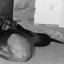

In [ ]:
not_faces[0]

Si ottiene l'immagine in scala di grigi con dimensioni 64x64 pixels.

#### Unione dei dataset coi volti e i non volti

Una volta preprocessate le immagini con volti e non volti è possibile concatenare i due array che le contengono, *faces* e *not_faces*, in un unico array X.

In [ ]:
X = np.concatenate((faces, not_faces), axis = 0)
X.shape

(41932, 64, 64)

Questo array **X**, contenete ora sia i volti che i non volti, è correttamente costituito da **41932 immagini** di dimensioni **64x64 pixels**.

Vengono di seguito mandate a schermo la prima e l'ultima immagine contenente un volto e la prima e l'ultima immagine contenente un non volto.

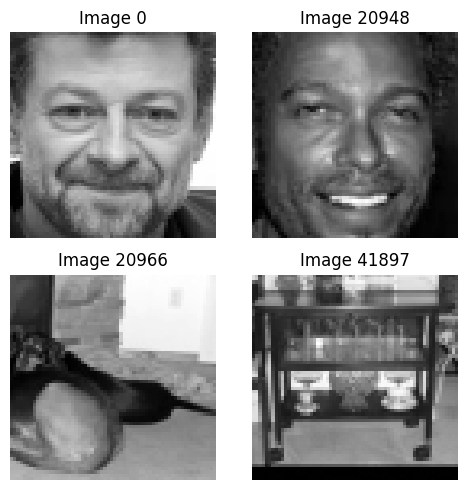

In [ ]:
INDEXES = [0, 20948, 20966, 41897]

fig, axs = plt.subplots(2, 2, figsize=(5, 5))

for i, idx in enumerate(INDEXES):
    row = i // 2
    col = i % 2
    axs[row, col].imshow(X[idx], cmap='gray')
    axs[row, col].set_title(f'Image {idx}')
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

#### Creazione dell'array del target

Arrivati a questo punto è necessario costruire l'array del target y costituito dalle due seguenti classi:
* **Classe 1**: l'immagine rappresenta un volto.
* **Classe 0**: l'immagine non rappresenta un volto.

Tale array y viene costruito assegnando il valore "1" ai primi 20966 elementi (faces) e il valore "0" ai restanti 20966 elementi (not faces).

Oltre a costruire il target e a verificare le sue dimensioni vengono mandate a schermo di seguito, per confermare la bontà della procedura, le prime 5 e le ultime 5 labels dell'array e i due elementi che sanciscono il passaggio dalla classe 1 alla classe 0.

In [ ]:
y = np.array([1]*faces.shape[0] + [0]*not_faces.shape[0])

print(y.shape)

print('\nFirst 5 labels:', y[:5])
print('Last image with a face: label', y[20948])
print('First image without a face: label', y[20966])
print('Last 5 labels:', y[-5:])

(41932,)

First 5 labels: [1 1 1 1 1]
Last image with a face: label 1
First image without a face: label 0
Last 5 labels: [0 0 0 0 0]


L'array del target y ha dimensione (41932,) e le sue labels sono state assegnate correttamente.

## Face Classification

Una volta preparato il dataset contenente volti e non volti si può passare a costruire il modello di Machine Learnig in grado di effettuare la **Face Classification**. Come già detto all'inizio, il classificatore sarà un **Support Vector Classifier (SVC)** che prenderà in input le features delle immagini trasformate attraverso l'algoritmo **Histogram of Oriented Gradients (HOG)**.

### **Histogram of Oriented Gradients (HOG)**

Per calcolare le HOG features verrà utilizzata la funzione *hog* della libreria *scikit-image*. Nella documentazione di scikit-image vengono fornite una descrizione teorica del descrittore HOG e una sua implementazione che verranno utilizzate come guida nel presente progetto:<br>
https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_hog.html

Il descrittore **Histogram of Oriented Gradients (HOG)** è una tecnica molto utilizzata per il rilevamento di oggetti. Ecco un riassunto delle parti fondamentali dell'algoritmo HOG:

1. **Normalizzazione globale dell'immagine** (opzionale): Questa fase serve a ridurre l'influenza delle variazioni di illuminazione. Si utilizza la compressione gamma, calcolando il logaritmo o la radice quadrata di ogni canale di colore per ridurre gli effetti di ombre e variazioni di illuminazione.

2. **Calcolo dei gradienti dell'immagine**: Si calcolano i gradienti dell'immagine nelle direzioni x e y per catturare contorni, silhouette e alcune informazioni di texture, migliorando la resistenza alle variazioni di illuminazione.

3. **Calcolo degli istogrammi dei gradienti**: L'immagine viene suddivisa in piccole regioni spaziali chiamate "celle". Per ogni cella, si accumula un istogramma 1-D delle orientazioni dei gradienti o dei bordi dei pixel presenti nella cella. Questo istogramma di orientazione rappresenta la distribuzione delle direzioni dei gradienti.

4. **Normalizzazione tra blocchi**: Le celle vengono raggruppate in blocchi e le loro risposte vengono normalizzate per migliorare l'invarianza all'illuminazione, alle ombre e al contrasto dei bordi. Ogni cella può apparire in diversi blocchi, con normalizzazioni differenti, migliorando così le prestazioni complessive.

5. **Formazione del vettore delle caratteristiche**: Gli HOG descrittori normalizzati vengono raccolti da tutti i blocchi in una griglia densa che copre l'intera finestra di rilevamento. Questo vettore combinato di caratteristiche viene poi utilizzato nel classificatore per rilevare oggetti.

In sintesi, l'algoritmo HOG utilizza gradienti e orientazioni per rappresentare le caratteristiche locali dell'immagine, normalizzando le risposte per migliorare la robustezza alle variazioni di illuminazione e contrasto.

Di seguito viene implementato l'algoritmo HOG sulla prima immagine del dataset. Per ottenere il feature descriptor *fd* e l'immagine trasformata *hog_image* viene utilizzata dunque la funzione *hog* specificando i seguenti argomenti:
* *image=image*: prima immagine dell'array X *image=X[0]*.
* *orientations=9*: un valore comune del numero di orientamenti del gradiente è tra 6 e 12 e in questo caso si sceglie 9. Più orientamenti aumentano la capacità del descrittore di catturare dettagli, ma aumentano anche la dimensione del vettore delle caratteristiche.
* *pixels_per_cell=(8, 8)*: dimensioni in pixel di ogni cella. Valori comuni sono (8, 8) o (16, 16). Celle più piccole catturano più dettagli locali, mentre celle più grandi riducono la dimensione del vettore delle caratteristiche ma possono perdere dettagli fini.
* *cells_per_block=(2, 2)*: Un valore comune per il numero di celle in ogni blocco è (2, 2). I blocchi aiutano a normalizzare le caratteristiche su diverse regioni dell'immagine, migliorando la robustezza alle variazioni di illuminazione.
* *visualize=True*: restituisce anche l'immagine dei gradienti orientati.

Dopodichè vengono mandate a schermo le dimensioni del feature descriptor e i suoi primi 5 elementi e vengono plottati i grafici dell'immagine prima e dopo l'applicazione dell'algoritmo HOG.


Feature Descriptor dimensions: (1764,)
First 5 elements of fd array: [0.27929863 0.25060336 0.06722503 0.12033748 0.15680549]



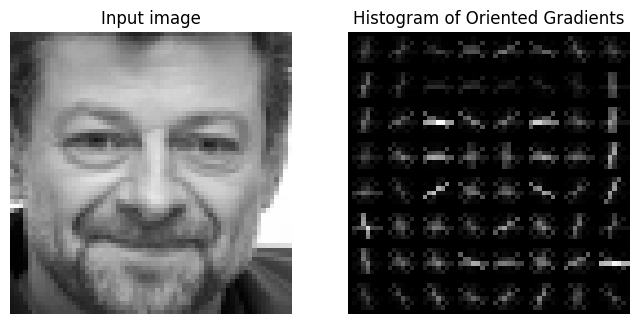

In [ ]:
image=X[0]

fd, hog_image = hog(image=image,
                    orientations=9,
                    pixels_per_cell=(8, 8),
                    cells_per_block=(2, 2),
                    visualize=True)

print('Feature Descriptor dimensions:', fd.shape)
print('First 5 elements of fd array:', fd[:5])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')

ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')

print('')

plt.show()

### HOG Features Extraction

Dunque, dopo aver descritto e applicato il descrittore HOG sulla prima immagine si procede ad estrarre le hog features da tutte le immagini presenti nell'array X salvandole nell'array *hog_features_X*. Per estrarre tali features viene costruita la funzione *get_hog_features*.

In [ ]:
def get_hog_features(image,
                     orientations=9,
                     pixels_per_cell=(8, 8),
                     cells_per_block=(2, 2)):

    """
    Extract Histogram of Oriented Gradients (HOG) features from a 2D grayscale
    image.

    Parameters:
    image (ndarray): 2D grayscale image.
    orientations (int): Number of orientation bins. Default is 9.
    pixels_per_cell (tuple): Size (in pixels) of a cell. Default is (8, 8).
    cells_per_block (tuple): Number of cells in each block. Default is (2, 2).

    Returns:
    ndarray: HOG feature vector.

    Raises:
    ValueError: If the input image is not a 2D grayscale image.
    """

    if len(image.shape) != 2:
        raise ValueError("Input image must be a 2D grayscale image")

    return hog(image,
               orientations,
               pixels_per_cell=pixels_per_cell,
               cells_per_block=cells_per_block,
               feature_vector=True)

In [ ]:
hog_features_list = []

for image in X:
    fd = get_hog_features(image)
    hog_features_list.append(fd)

hog_features_X = np.array(hog_features_list)

print('HOG Features array dimensions:', hog_features_X.shape)
print('HOG Features min value:', hog_features_X.min())
print('HOG Features max value:', hog_features_X.max())

HOG Features array dimensions: (41932, 1764)
HOG Features min value: 0.0
HOG Features max value: 0.9999999987499999


L'array delle HOG features è costituito da 1764 valori compresi tra 0 ed 1 per ciascuna delle 41932 immagini (i valori sono dunque normalizzati e pronti per essere utilizzati dal classificatore).

### SVC with HOG Features

Arrivati a questo punto è possibile utilizzare le hog features estratte per costruire il set di addestramento e di test (**Hold-out**) su cui verrà addestrato e valutato il classificatore (**SVM**) tramite la funzione *train_test_split*. L'80 % del dataset andrà a costituire il Train Set e il 20% il Test Set.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(hog_features_X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=42)

print('Train Set dimensions:', X_train.shape, y_train.shape)
print('Test Set dimensions:', X_test.shape, y_test.shape)

Train Set dimensions: (33545, 1764) (33545,)
Test Set dimensions: (8387, 1764) (8387,)


Si osserva come **33545 immagini** ciascuna con le sue **1764 HOG features** e il rispettivo **targe**t costituiscono rispettivamente l'**X_train**  e l'**y_train** e **8387 immagini** costituiscono allo stesso modo l'**X_test** e l'**y_test**.

Si procede allora ad effettuare una **Grid Search** per trovare il kernel del **Support Vector Classifier (SVC)** che massimizza l'accuracy.
Nel presente caso si procede tramite i seguenti passaggi:
* Si instanzia il classificatore *SVC* con i parametri *probability=True* e *random_state=42*.
* Viene costruita la griglia dei parametri da valutare *param_grid_svc* che saranno i kernel *linear*, *poly*, *rbf* e *sigmoid*.
* Viene utilizzato *GridSearchCV* per effettuare la grid search specificando come *estimator* e *param_grid* rispettivamente *svc* e la griglia dei parametri precedentemente creati, come *scoring* l'accuracy e come *cv* *StratifiedKFold* con *n_splits=5*, *shuffle=True* e *random_state=42*.
* Viene utilizzato il metodo *fit* di *GridSearchCV* per effettuare la cross-validation sul Train Set e i metodi *best_params_* e *best_score_* per mandare a schermo la migliore combinazione di parametri e la relativa accuracy media sui Validation Set.

Dopo aver effettuato la grid search viene selezionato il miglior modello tramite il metodo *best_estimator_*, lo si addestra sulla totalità del Train Set e lo si valuta questa volta sul Test Set, contenente immagini mai viste dal modello durante la grid search. Per effettuare tale valutazione delle prestazioni del modello vengono effettuate le predizioni sul set di test tramite il metodo *predict* del classificatore e vengono ricavati il **Classification Report** contenente l'accuracy e le altre metriche d'interesse e la **Confusion Matrix** per vedere quali e quanti errori vengono commessi dal modello(si usano rispettivamente le funzioni *classification_report* e *confusion_matrix* di scikit-learn). Allo stesso modo vengono ricavati il classification report e la confusion matrix anche per il set di addestramento per valutare l'eventuale overfitting.

In [ ]:
svc = SVC(probability=True, random_state=42)

param_grid_svc = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

gs_svc = GridSearchCV(estimator=svc,
                      param_grid=param_grid_svc,
                      scoring='accuracy',
                      cv=kf,
                      n_jobs=-1)

gs_svc.fit(X_train, y_train)

print(f'Best params SVC: {gs_svc.best_params_}')
print(f'Best Mean Validation Accuracy SVC {gs_svc.best_score_:.4f}')

svc = gs_svc.best_estimator_
svc.fit(X_train, y_train)

y_pred_train = svc.predict(X_train)
y_pred_test = svc.predict(X_test)

print('\nTrain Set - Classification Report:')
print(classification_report(y_train, y_pred_train, digits=4))

print('\nTrain Set - Confusion Matrix:')
print(confusion_matrix(y_train, y_pred_train))

print('\nTest Set - Classification Report:')
print(classification_report(y_test, y_pred_test, digits=4))

print('\nTest Set - Confusion Matrix:')
print(confusion_matrix(y_test, y_pred_test))

Best params SVC: {'kernel': 'rbf'}
Best Mean Validation Accuracy SVC 0.9989

Train Set - Classification Report:
              precision    recall  f1-score   support

           0     0.9997    1.0000    0.9999     16830
           1     1.0000    0.9997    0.9999     16715

    accuracy                         0.9999     33545
   macro avg     0.9999    0.9999    0.9999     33545
weighted avg     0.9999    0.9999    0.9999     33545


Train Set - Confusion Matrix:
[[16830     0]
 [    5 16710]]

Test Set - Classification Report:
              precision    recall  f1-score   support

           0     0.9990    0.9995    0.9993      4136
           1     0.9995    0.9991    0.9993      4251

    accuracy                         0.9993      8387
   macro avg     0.9993    0.9993    0.9993      8387
weighted avg     0.9993    0.9993    0.9993      8387


Test Set - Confusion Matrix:
[[4134    2]
 [   4 4247]]


I risultati della grid search mostrano che il miglior kernel per il SVC è il **Kernel Gaussiano (Radial Basis Function)** con cui si ottiene un'accuracy media sul validation set pari al 99.89 %.<br>
Con tale classificatore si ottengono delle prestazioni quasi perfette e senza overfitting: **accuracy sul test set pari al 99.93 %** di pochissimo inferiore al train set dove è pari al 99.99 %. Anche precision e recall risultano essere vicine al 100 %.<br>
Per quanto riguarda le matrici di confusione, invece, si osservano sul train set 5 errori totali su 33545 immagini (5 falsi negativi e nessun falso positivo) mentre sul test set 6 errori totali su 8387 immagini (4 falsi negativi e 2 falsi positivi).

Verificate le ottime prestazioni del SVC con le HOG features è possibile salvare tale modello addestrato utilizzando la libreria *joblib* e in particolare la sua funzione *dump*.

In [ ]:
joblib.dump(svc, 'face_classifier.joblib')

['face_classifier.joblib']

## Face Detection

Terminata la fase di Face Classification è possibile procedere con la **Face Detection** con l'obiettivo di individuare con un riquadro (bounding box), in diversi tipi di immagine, la presenza di volti. Per fare questo viene preso in considerazione il famoso "selfie degli oscar" del 2014, mostrato all'inizio del notebook, su cui si tareranno i diversi parametri fondamentali.<br>


Il primo passo è quello di creare la funzione *load_image*. Questa funzione carica un'immagine con *OpenCV* tramite il suo percorso (unico argomento della funzione) assicurandosi che sia in un formato supportato, che venga caricata in maniera corretta e che abbia 1 oppure 3 canali. Nel caso l'immagine caricata sia a colori la funzione restituisce in forma di array l'immagine originale a colori (*original_image*) e l'immagine convertita in scala di grigi (*gray_image*) mentre nel caso l'immagine caricata sia già in scala di grigi *original_image* e *gray_image* coincidono. La necessità di avere entrambe le immagini è dovuta al fatto che, nel caso l'immagine sia a colori, le HOG features vengono estratte dall'immagine in scala di grigi mentre i riquadri sui volti devono essere disegnati sull'immagine originale a colori

In [ ]:
def load_image(image_path):

    """
    Load an image from a file and convert it to grayscale if necessary.

    Parameters:
    image_path (str): Path to the image file.

    Returns:
    tuple: Original image and grayscale image.

    Raises:
    ValueError: If the image format is unsupported or if the image cannot be
                loaded.
    """

    SUPPORTED_FORMATS = ['.jpg', '.jpeg', '.png', '.bmp', '.gif']

    if not any(image_path.lower().endswith(ext) for ext in SUPPORTED_FORMATS):
        raise ValueError(f"Unsupported image format from {image_path}. "\
                         f"Supported formats are {', '.join(SUPPORTED_FORMATS)}")

    image = cv2.imread(image_path)

    if image is None:
        raise ValueError(f'Error loading image from {image_path}')

    if len(image.shape) == 2:
        gray_image = image
        original_image = image

    elif len(image.shape) == 3 and image.shape[2] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        original_image = image

    else:
        raise ValueError(f'Unsupported image format from {image_path}. '+
                         f'Only grayscale or 3-channel color images are supported.')

    return original_image, gray_image

Si testa allora la funzione *load_image* sul selfie degli oscar 2014. Tale immagine viene caricata da kaggle insieme ad altre immagini che verranno usate per testate la bontà del prototipo.

In [ ]:
!kaggle datasets download -d virginiococciaglia/test-images

DATA_FOLDER = '/content/test_images'
os.makedirs(DATA_FOLDER, exist_ok=True)

ZIP_FILE = '/content/test-images.zip'

with zipfile.ZipFile(ZIP_FILE, 'r') as zip_ref:
    zip_ref.extractall(DATA_FOLDER)

Dataset URL: https://www.kaggle.com/datasets/virginiococciaglia/test-images
License(s): unknown
100% 2.99M/2.99M [00:00<00:00, 5.61MB/s]
100% 2.99M/2.99M [00:00<00:00, 4.76MB/s]


array([[[ 63,  65,  66],
        [ 33,  35,  36],
        [ 40,  42,  43],
        ...,
        [ 82,  70,  64],
        [ 86,  74,  68],
        [ 99,  87,  81]],

       [[ 31,  33,  34],
        [  0,   1,   2],
        [  4,   6,   7],
        ...,
        [ 59,  47,  41],
        [ 62,  50,  44],
        [ 78,  66,  60]],

       [[ 39,  41,  42],
        [  5,   7,   8],
        [  9,  10,  14],
        ...,
        [ 53,  42,  34],
        [ 53,  40,  32],
        [ 72,  59,  51]],

       ...,

       [[ 39,  46, 109],
        [  8,  14,  79],
        [ 13,  17,  88],
        ...,
        [ 12,  12,   6],
        [  9,   9,   3],
        [ 45,  45,  39]],

       [[ 33,  39,  98],
        [  7,  12,  73],
        [  6,   9,  77],
        ...,
        [  6,   8,   2],
        [  5,   6,   2],
        [ 36,  37,  33]],

       [[ 57,  64, 121],
        [ 33,  39,  98],
        [ 35,  39, 104],
        ...,
        [ 41,  43,  37],
        [ 37,  38,  34],
        [ 65,  66,  62]]], dtype=uint8)
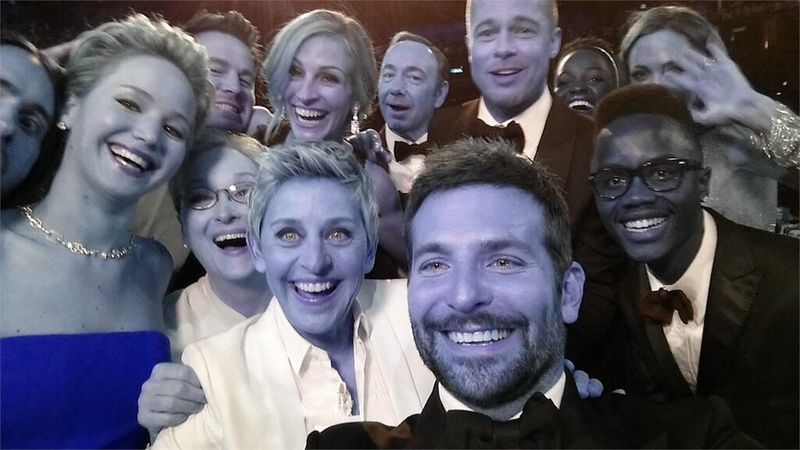

In [ ]:
selfie_oscar, selfie_oscar_gray = load_image('/content/test_images/selfie_oscar.jpg')
selfie_oscar

array([[65, 35, 42, ..., 70, 74, 87],
       [33,  1,  6, ..., 47, 50, 66],
       [41,  7, 11, ..., 41, 39, 58],
       ...,
       [64, 33, 38, ..., 10,  7, 43],
       [56, 30, 29, ...,  6,  5, 36],
       [80, 56, 58, ..., 41, 37, 65]], dtype=uint8)
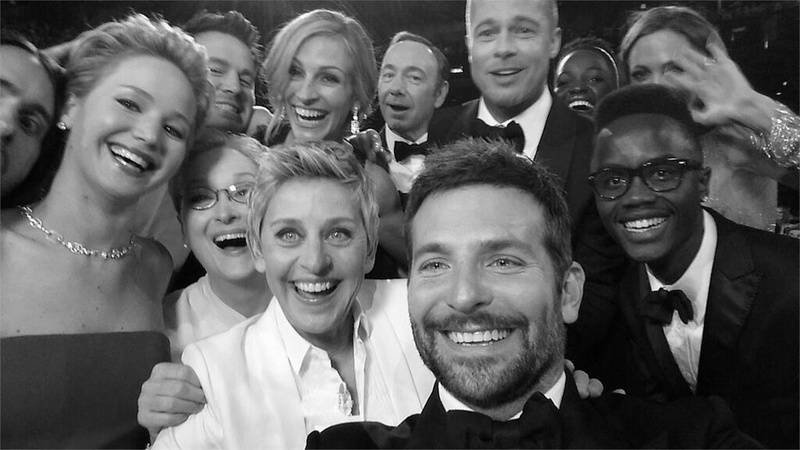

In [ ]:
selfie_oscar_gray

Si ottengono l'immagine originale a colori e l'immagine in scala di grigi come desiderato. Si può osservare, però, che l'immagine originale è in BGR anzichè in RGB ma questo non è un problema poichè in seguito nei prossimi passaggi sarà utilizzata la funzione *cv2_imshow* che leggerà l'immagine in RGB.

### Image Pyramids e Sliding Windows

Per effettuare la face detection, come anticipato all'inizio della trattazione, verranno utilizzate due tecniche in combinazione:
* **Image Pyramids**
* **Sliding Windows**

Per studiare il funzionamento teorico di queste tecniche e la loro applicazione tramite *OpenCV* si prende in considerazione il blog *pyimagesearch*:<br>
https://pyimagesearch.com/2015/03/16/image-pyramids-with-python-and-opencv/<br>
https://pyimagesearch.com/2015/03/23/sliding-windows-for-object-detection-with-python-and-opencv/

Una **Image Pyramid** ("piramide di immagini") è una rappresentazione multi-scala di un'immagine che permette di individuare oggetti in immagini a diverse scale. Infatti, combinandola con una sliding window, possiamo trovare oggetti in varie posizioni. Alla base della piramide c'è l'immagine alla sua dimensione originale e ad ogni livello successivo l'immagine viene ridimensionata (sottocampionata) e opzionalmente sfocata (solitamente con un filtro gaussiano). Questo processo continua finché non si raggiunge una dimensione minima prestabilita.

Nel contesto della computer vision, una **Sliding Window** ("finestra scorrevole") è una regione rettangolare di larghezza e altezza fisse che "scorre" attraverso un'immagine. Per ogni finestra, si applica un classificatore di immagini per determinare se contiene un oggetto di interesse, ad esempio un volto come nel presente caso. <br>Dunque, combinando image pyramids e sliding windows, è possibile creare classificatori di immagini che riconoscono oggetti a scale e posizioni diverse.



Si procede quindi a costruire due funzioni che applicano le due tecniche appena descritte.<br> La funzione *pyramid* ha come argomenti l'immagine da dare in input come array, il fattore di scala con cui ridimensionare di volta in volta l'immagine originale e le dimensioni minime oltre il quale fermare il ridimensionamento. Tale funzione restituisce un generatore che produce una sequenza di immagini ridimensionate. Ogni chiamata al generatore restituisce la prossima immagine nella piramide, iniziando dall'immagine originale e ridimensionandola ripetutamente fino a raggiungere la dimensione minima specificata.<br>
La funzione *sliding_window* ha come argomenti sempre l'array dell'immagine e i parametri *stepSize* e *windowSize* che rappresentano
rispettivamente il numero di pixel con cui scorre in orizzontale e verticale la sliding window e le dimensioni della sliding window stessa. Tale funzione restituisce un generatore che produce una serie di tuple contenenti: le coordinate (x, y) dell'angolo superiore sinistro della finestra scorrevole e la porzione dell'immagine corrispondente alla finestra scorrevole (un array numpy).<br>



In [ ]:
def pyramid(image, scale, minSize):

    """
    Generate a pyramid of images by scaling down the original image.

    Parameters:
    image (ndarray): Input image.
    scale (float): Scaling factor.
    minSize (tuple): Minimum size of the image.

    Yields:
    ndarray: Scaled images.
    """

    yield image

    while True:
        w = int(image.shape[1] / scale)
        image = imutils.resize(image, width=w)
        if image.shape[0] < minSize[1] or image.shape[1] < minSize[0]:
            break
        yield image


def sliding_window(image, stepSize, windowSize):

    """
    Slide a window across the image and yield the window's position and content.

    Parameters:
    image (ndarray): Input image.
    stepSize (int): Step size in pixels.
    windowSize (tuple): Size of the sliding window.

    Yields:
    tuple: (x, y, window) where x and y are the top-left coordinates and window
           is the image patch.
    """

    for y in range(0, image.shape[0], stepSize):
        for x in range(0, image.shape[1], stepSize):
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

Successivamente viene definita la funzione *find_faces*. Questa funzione rileva i volti in un'immagine utilizzando le funzioni *pyramid* e *sliding window* appena definite e il classificatore pre-addestrato (SVC) caricato con *joblib*. La funzione riceve innanzitutto in input l'immagine originale e la sua versione in scala di grigi: si tratta degli unici argomenti della funzione e possono essere ottenuti tramite *load_image*. Dopodichè la funzione itera su tutte le immagini (in scala di grigi) generate con la image pyramid e per ognuna di esse  applica una sliding window di dimensioni 64x64 pixels (dimensioni con cui si è addestrato il classificatore) per scansionare le immagini, estraendo le HOG Features da ogni finestra.
Queste caratteristiche vengono poi date come input al classificatore SVC che predice l'eventuale presenza di un volto e calcola la probabilità associata. Se la predizione indica un volto e la probabilità supera il 79 %, la funzione salva le coordinate del volto rilevato e la probabilità rispettivamente nelle due liste *detected_faces* e *probabilities*. Infine, terminata l'iterazione, restituisce tali liste.<br>
È importante sottolineare che nella funzione *find_faces* vengono utilizzate le funzione *pyramid* e *sliding_window* con i seguenti parametri:
* scale = 1.3
* minSize = (30, 30)
* stepSize = 16
* windowSize = (winW, winH) = (64, 64)

Si è giunti a tali parametri specifici per tentavi, cercando di ottimizzare la face detection per il selfie degli oscar, che come già detto viene utilizzato per tarare i parametri. Anche la scelta di usare la soglia di probabilità di 0.79 è dettata da diversi tentativi.

In [ ]:
def find_faces(original_image, gray_image):

    """
    Detect faces in an image using a pre-trained SVM classifier and HOG features.

    Parameters:
    original_image (ndarray): Original image.
    gray_image (ndarray): Grayscale version of the original image.

    Returns:
    tuple: (detected_faces, probabilities) where detected_faces is a list of
           bounding boxes and probabilities is a list of confidence scores for
           each detected face.
    """

    scale = 1.3
    minSize = (30, 30)
    stepSize= 16
    (winW, winH) = (64, 64)

    svc = joblib.load('face_classifier.joblib')

    detected_faces = []
    probabilities = []

    for resized in pyramid(gray_image, scale=scale, minSize=minSize):
        ratio = gray_image.shape[1] / float(resized.shape[1])
        for (x, y, window) in sliding_window(resized,
                                             stepSize=stepSize,
                                             windowSize=(winW, winH)):
            if window.shape[0] != winH or window.shape[1] != winW:
                continue

            fd = get_hog_features(window)
            fd = fd.reshape(1, -1)

            pred = svc.predict(fd)
            proba = svc.predict_proba(fd)

            if pred == 1 and proba[0, 1] > 0.79:
                detected_faces.append((int(x* ratio),
                                       int(y * ratio),
                                       int((x + winW) * ratio),
                                       int((y + winH) * ratio)))
                probabilities.append(proba[0, 1])

    return detected_faces, probabilities

Una volta ottenute le coordinate dei volti con le rispettive probabilità è necessario creare una funzione in grado di disegnare i veri e propri riquadri attorno ai volti (bounding boxes): *draw_bboxes*. Tale funzione ha come argomenti *original_image*, *detected_faces*, *probabilities* (questi ultimi due si ottengono per l'appunto con la precedente *find_faces*), *color* e *tickness*. Dunque, iterando su ciascun volto si utilizzano le funzioni *rectangle* e *putText* di *cv2* per disegnare i rettangoli sull'immagine originale indicando anche la probabilità che si tratti di un volto.

In [ ]:
def draw_bboxes(original_image,
                detected_faces,
                probabilities,
                color=(0, 255, 0),
                thickness=2):

    """
    Draw bounding boxes around detected faces on the image and annotate with
    probabilities.

    Parameters:
    original_image (ndarray): The original image on which to draw the boxes.
    detected_faces (list): List of bounding boxes for detected faces.
    probabilities (list): List of confidence scores for each detected face.
    color (tuple): Color of the bounding box in BGR format. Default is green.
    thickness (int): Thickness of the bounding box lines. Default is 2.
    """

    for ((x1, y1, x2, y2), proba) in zip(detected_faces, probabilities):

        cv2.rectangle(original_image, (x1, y1), (x2, y2), color, thickness)

        cv2.putText(original_image,
                    '{:.2f}'.format(proba),
                    (x1, y1 + 20),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.5,
                    color,
                    thickness)

    cv2_imshow(original_image)

Si testano, allora, tutte le precedenti funzioni che consentono di effettuare la face detection, sul selfie degli oscar.

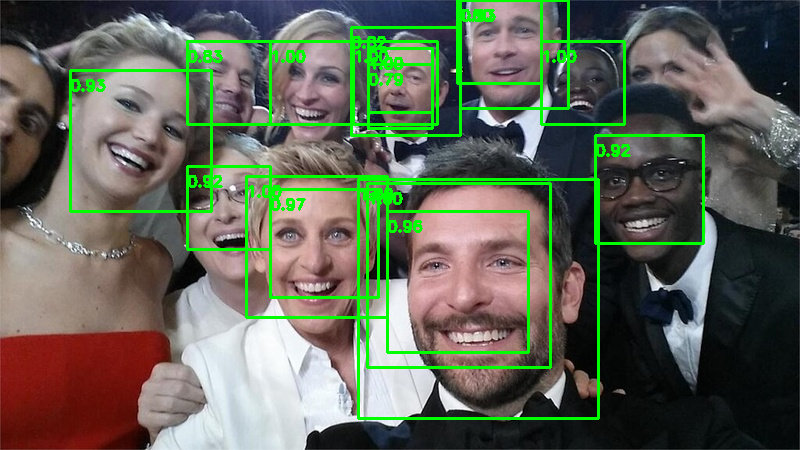

In [ ]:
original_image, gray_image = load_image('/content/test_images/selfie_oscar.jpg')
detected_faces, probabilities = find_faces(original_image, gray_image)
draw_bboxes(original_image, detected_faces, probabilities)

Tutti i volti vengono individuati dai bounding boxes, tuttavia, non si ha un risultato soddisfacente poichè diversi di essi hanno più bounding boxes sovrapposti. Una soluzione a questo problema può essere ottenuta tramite la Non Maximum Suppression.

### Non Maximum Suppression

Per risolvere il problema dei riquadri sovrapposti su un singolo volto è possibile utilizzare la tecnica: **Non Maximum Suppression (NMS)**. Per studiare il funzionamento teorico di questa tecnica e la sua implementazione tramite *OpenCV* si prende in considerazione il blog pyimagesearch:<br>
https://pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/

La NMS, dunque, è una tecnica utilizzata per ridurre le sovrapposizioni tra le bounding boxes rilevate durante il processo di localizzazione degli oggetti in un'immagine. L'obiettivo principale è selezionare le bounding boxes più accurate e significative, sopprimendo quelle che rappresentano duplicazioni o sovrapposizioni ridondanti.

Viene, allora, creata la funzione *non_max_suppression* che opera con i seguenti passaggi:

**Input**:

* *detected_faces*: un elenco di bounding boxes per i volti rilevati, ognuna definita da quattro coordinate (x1, y1, x2, y2).
* *probabilities*: un elenco di probabilità che ci sia un volto per ogni bounding box rilevata.
* overlapThresh: una soglia di sovrapposizione pari al 30% che determina quando due bounding boxes sono considerate troppo simili e una delle due deve essere soppressa.

**Ordinamento delle Bounding Boxes**:

Le bounding boxes sono ordinate in base alle probabilità in ordine decrescente. Questo ordine di priorità aiuta a trattare per primi le bounding boxes con maggiore probabilità di contenere l'oggetto di interesse.

**Iterazione e Soppressione**:

* Durante l'iterazione, viene considerata una bounding box alla volta in base all'ordine decrescente di probabilità.
* Viene calcolata l'area di intersezione tra la bounding box corrente e tutte le altre bounding boxes rimanenti.
* Viene calcolato il rapporto di sovrapposizione tra l'area di intersezione e l'area della bounding box corrente.
* Le bounding boxes che hanno un rapporto di sovrapposizione superiore alla soglia definita vengono soppresse (rimosse).

**Output**:

L'output dell'algoritmo è un elenco di bounding boxes selezionate dopo la soppressione delle sovrapposizioni, rappresentando le rilevazioni più accurate e distinte degli oggetti nell'immagine, insieme alle loro rispettive probabilità.




In [ ]:
def non_max_suppression(detected_faces, probabilities, overlapThresh=0.3):

    """
    Perform non-maximum suppression to remove overlapping bounding boxes.

    Parameters:
    detected_faces (list): List of bounding boxes for detected faces.
                           Each bounding box is defined by four coordinates
                           (x1, y1, x2, y2).
    probabilities (list): List of confidence scores for each detected face.
    overlapThresh (float): Overlap threshold for suppression. Default is 0.3.

    Returns:
    tuple: (kept_detected_faces, kept_probabilities) where kept_detected_faces
           is a list of bounding boxes after non-maximum suppression and
           kept_probabilities is a list of confidence scores corresponding
           to the kept bounding boxes.
    """

    if len(detected_faces) == 0:
        return [], []

    boxes = np.array(detected_faces)
    probs = np.array(probabilities)
    pick = []

    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]

    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(probs)[::-1]

    while len(idxs) > 0:
        last = len(idxs) - 1
        i = idxs[0]
        pick.append(i)

        xx1 = np.maximum(x1[i], x1[idxs[1:]])
        yy1 = np.maximum(y1[i], y1[idxs[1:]])
        xx2 = np.minimum(x2[i], x2[idxs[1:]])
        yy2 = np.minimum(y2[i], y2[idxs[1:]])

        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)

        overlap = (w * h) / area[idxs[1:]]

        idxs = np.delete(idxs,
                         np.concatenate(
                             ([0], np.where(overlap > overlapThresh)[0] + 1)))

    kept_detected_faces = boxes[pick].tolist()
    kept_probabilities = probs[pick].tolist()

    return kept_detected_faces, kept_probabilities

A questo punto viene ritentata la face detection sul selfie degli oscar appicando la NMS sulle *detected_faces*.

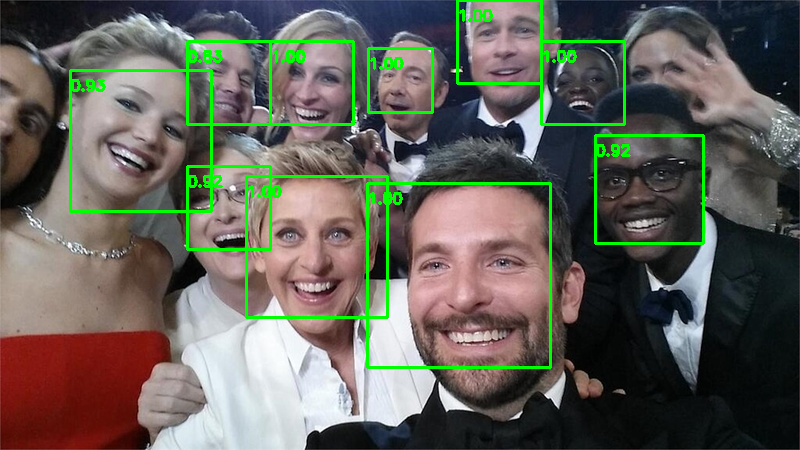

In [ ]:
original_image, gray_image = load_image('/content/test_images/selfie_oscar.jpg')
detected_faces, probabilities = find_faces(original_image, gray_image)
kept_detected_faces, kept_probabilities = non_max_suppression(detected_faces,
                                                              probabilities)
draw_bboxes(original_image, kept_detected_faces, kept_probabilities)

Il risultato ottenuto dopo aver applicato la non maximum suppression è molto soddisfaciente: tutti i volti degli attori e delle attrici presenti nel selfie sono stati individuati correttamente (Angelina Jolie e Jared Leto non vengono individuati essendo i loro volti parzialmente coperti, anche nell'immagine iniziale essi non erano individuati, ciò dunque non rappresenta un problema).

## Test del prototipo di face detection su immagini varie

A questo punto è possibile testare il sistema di identificazioni di volti sulle diverse immagini presenti nella cartella *test_images*. Queste immagini hanno differenti caratteristiche in modo da verificare la bontà del sistema in diverse situazioni: una sola persona, due o tre persone, gruppi di persone, immagini in scala di grigi, dimensioni in pixels e formati differenti.

Per fare ciò risulta però conveniente creare la funzione *face_detection* che racchiude tutte le precedenti operazioni neccessarie per il riconoscimento volti. Questa funzione avrà come unico input il percorso dell'immagine da esaminare.

In [ ]:
def face_detection(image_path):

    """
    Perform face detection on an image and display the result.

    Parameters:
    image_path (str): Path to the image file.

    Returns:
    None
        Displays the original image with bounding boxes drawn around detected
        faces.
    """

    original_image, gray_image = load_image(image_path)
    detected_faces, probabilities = find_faces(original_image, gray_image)
    kept_detected_faces, kept_probabilities = non_max_suppression(detected_faces,
                                                                  probabilities)
    draw_bboxes(original_image, kept_detected_faces, kept_probabilities)

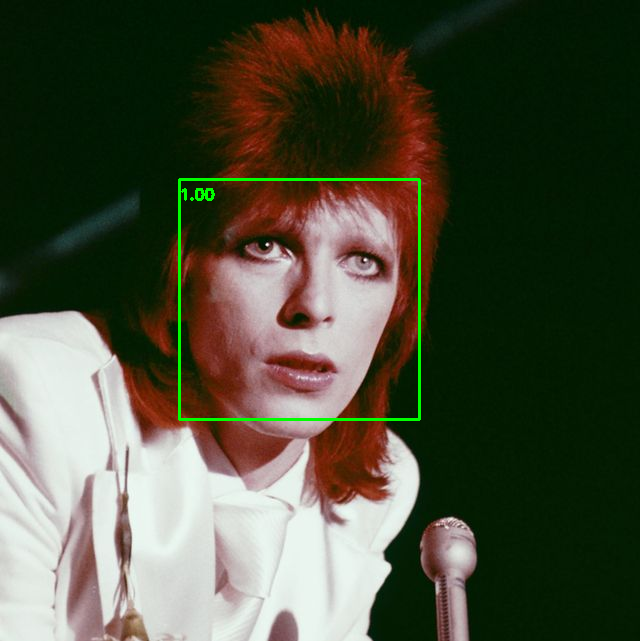

In [ ]:
face_detection('/content/test_images/david_bowie.jpg')

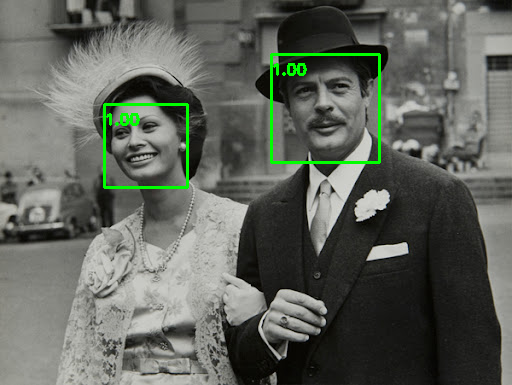

In [ ]:
face_detection('/content/test_images/mastroianni_loren.jpg')

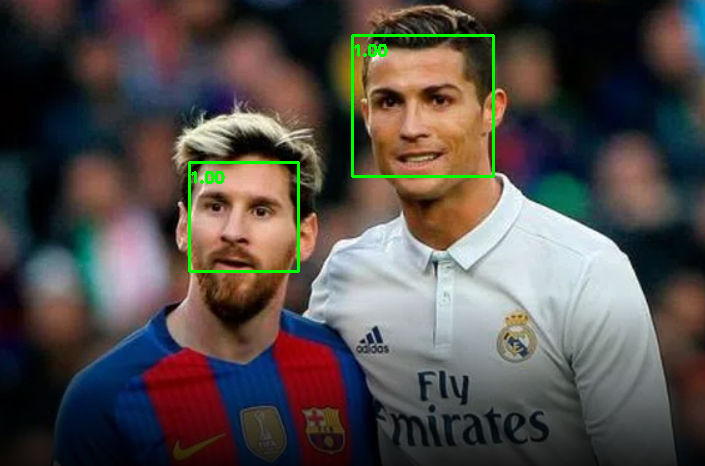

In [ ]:
face_detection('/content/test_images/messi_ronaldo.png')

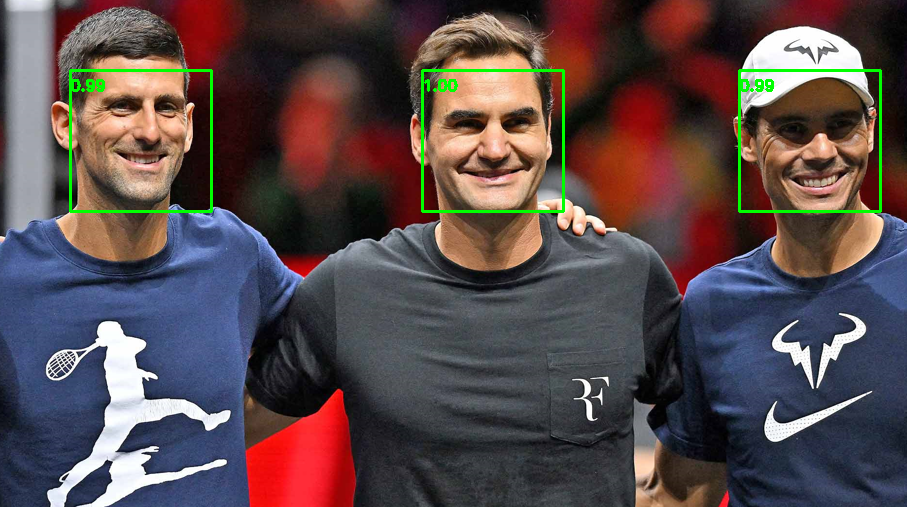

In [ ]:
face_detection('/content/test_images/fab3.png')

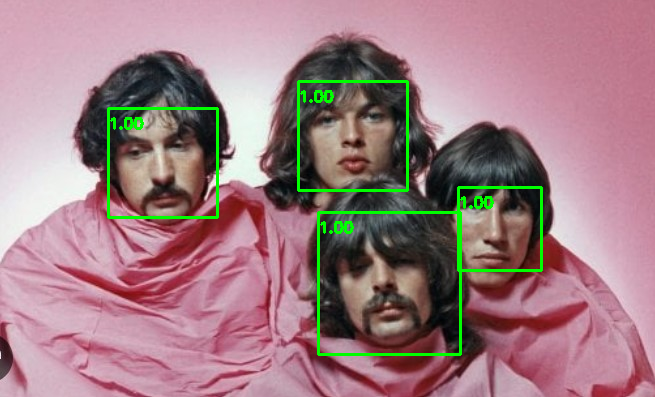

In [ ]:
face_detection('/content/test_images/pink_floyd.jpg')

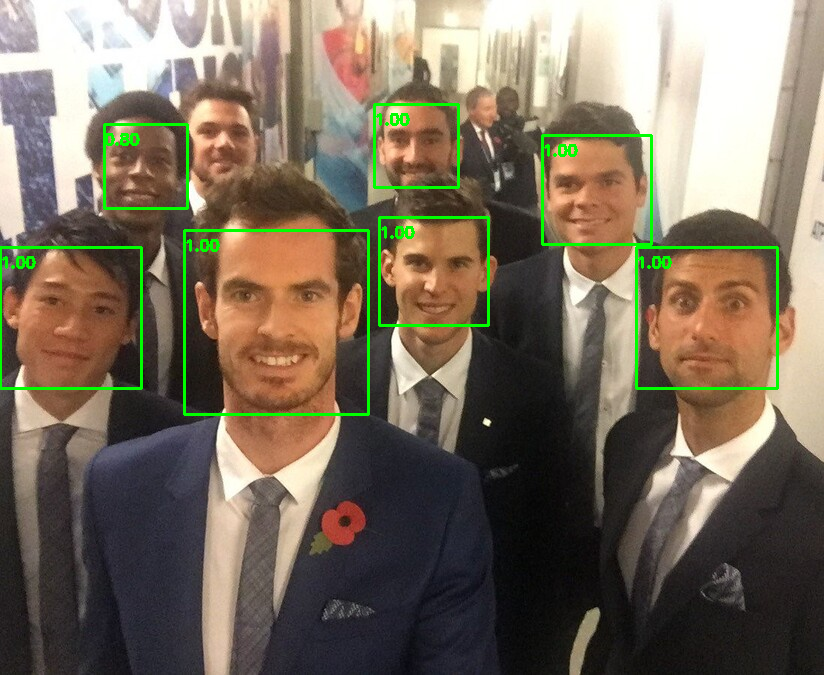

In [ ]:
face_detection('/content/test_images/atp_finals.jpg')

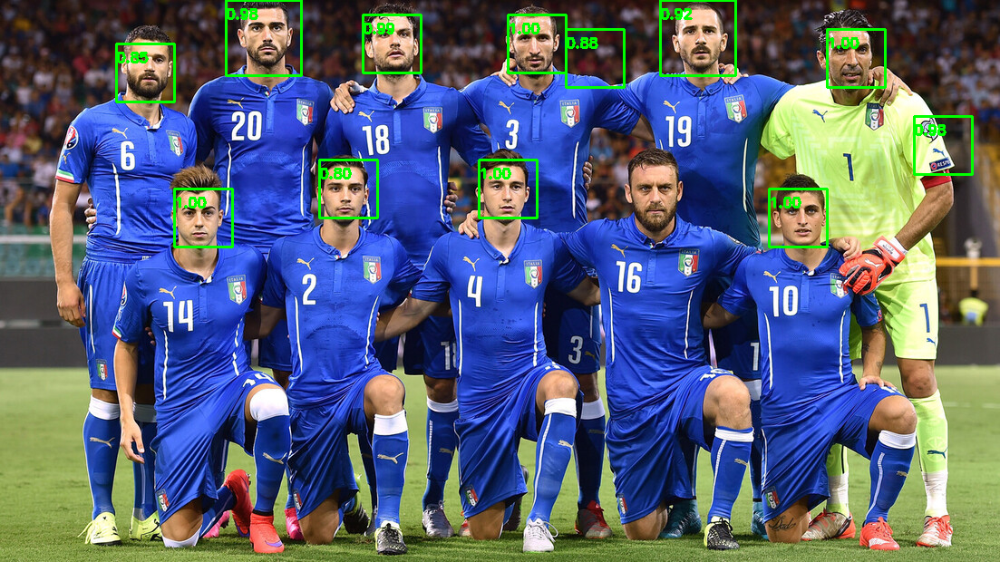

In [ ]:
face_detection('/content/test_images/nazionale_italiana.jpg')

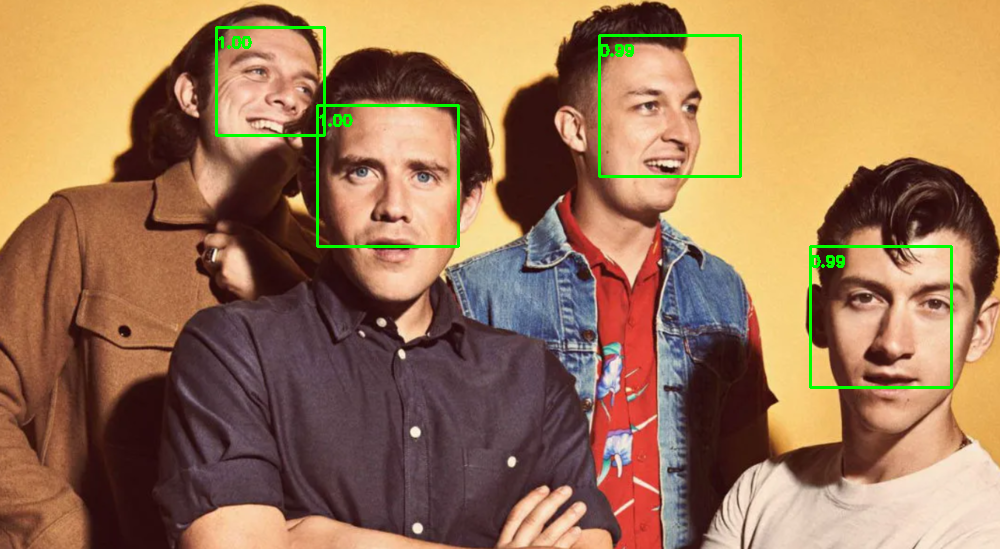

In [ ]:
face_detection('/content/test_images/arctic_monkeys.png')

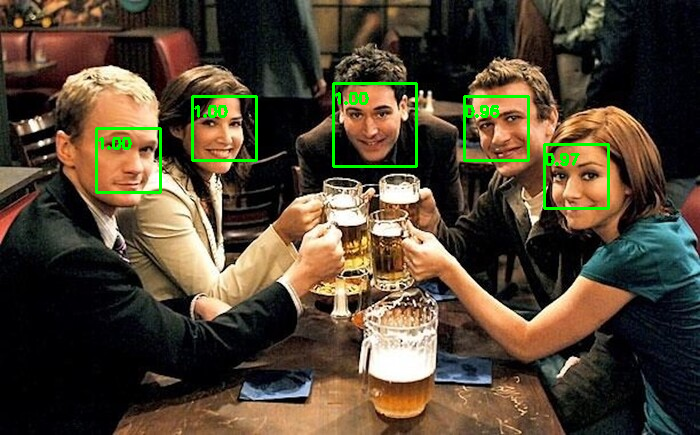

In [ ]:
face_detection('/content/test_images/himym.jpg')

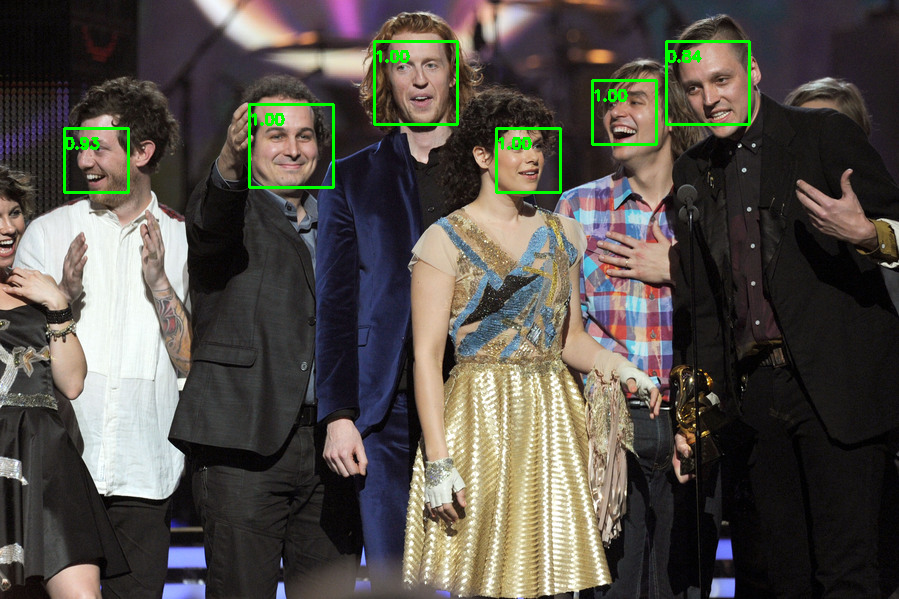

In [ ]:
face_detection('/content/test_images/arcade_fire.jpg')

Testato il sistema di face detection sulle precedenti immagini si procede ad analizzare i risultati. Soltanto in 2 delle 10 immagini analizzate sono presenti delle rilevazioni mancanti o errate. La prima è il selfie delle atp finals in cui 7/8 volti dei tennisti vengono riconosciuti correttamente. L'unico tennista non riconosciuto, Wawrinka, è il più arretrato e si tratta perciò del volto più piccolo nella foto. La seconda ed ultima immagine contenente errori, invece, è la foto di squadra della nazionale italiana di calcio, immagine tra le 10 con le dimensioni maggiori e con i volti di più piccole dimensioni al suo interno. In questo caso 10/11 volti dei calciatoti vengono riconosciuti e sono presenti anche 2 falsi positivi. Dunque, in totale nelle 10 immagini vengono riconosciuti 44/46 volti con soli 2 falsi positivi.<br>
In conclusione, considerando la necessità di creare un modello che richiede poche risorse computazionali, si può essere soddisfatti delle prestazioni che si ottengono col sistema di face detection su immagini  contenenti volti di dimensioni differenti e in posizioni variegate.